# Fitting the Model
---
We use an ensemble of boosted trees to create a model that fits our data.

In [128]:
import pandas as pd
import numpy as np
from catboost import CatBoostRegressor, Pool, cv, CatBoostClassifier
from sklearn.metrics import *
from matplotlib import pyplot as plt
from sklearn.ensemble import RandomForestRegressor
import hyperopt
from numpy.random import RandomState

COLLECTED_DATA_DIR = 'Collected Data/'

## Data Preparation
---
Load all the data:

In [117]:
books = pd.read_csv(COLLECTED_DATA_DIR + 'orig_data.csv').set_index('ID')
info = pd.read_csv(COLLECTED_DATA_DIR + 'book_info.csv').set_index('ID')
features = pd.read_csv(COLLECTED_DATA_DIR + 'features.csv').rename(columns={'BookID' : 'ID'}).set_index('ID')

display(books.head(), books.shape, info.head(), info.shape, features.head(), features.shape)

,Title,Author
ID,,
0545790352,Harry Potter and the Sorcerer's Stone: The Ill...,J.K. Rowling
1419717014,Diary of a Wimpy Kid: Old School,Jeff Kinney
1423160916,"Magnus Chase and the Gods of Asgard, Book 1: T...",Rick Riordan
1476789886,Rush Revere and the Star-Spangled Banner,Rush Limbaugh
1338029991,Harry Potter Coloring Book,Scholastic


(13605, 2)

,Sales Rank,Date,Review Score,Review Count
ID,,,,
0553522779,799.0,"July 28, 2015",4.78,1122
1596471328,217944.0,"January 1, 2007",4.63,8
0981973353,711910.0,"March 30, 2011",5.00,12
0822549328,8034749.0,"August 1, 1998",4.00,1
061559722X,1069427.0,"November 28, 2014",5.00,4


(13535, 4)

,Brightness,Colorfulness,Entropy,UniqueColors,Keypoints,Color1R,Color1G,Color1B,Color2R,Color2G,Color2B
ID,,,,,,,,,,,
0689871872,0.393601,30.900888,7.208404,55245,0.025003,35,42,68,117,91,75
0802774067,0.631390,90.699536,7.118225,123764,0.014360,188,236,193,208,240,166
1442496797,0.525140,122.037335,6.843093,56732,0.018625,4,185,197,3,90,108
0375824308,0.508363,62.399971,7.407145,95994,0.024494,180,163,120,41,135,101
0395899257,0.841409,112.527855,3.904536,43675,0.007876,252,252,76,252,252,244


(13478, 11)

We can join all three of these to get our full dataset:

In [118]:
data = features.join(info).join(books)  # Will automatically join on the ID column
display(data.head(), data.shape)

,Brightness,Colorfulness,Entropy,UniqueColors,Keypoints,Color1R,Color1G,Color1B,Color2R,Color2G,Color2B,Sales Rank,Date,Review Score,Review Count,Title,Author
ID,,,,,,,,,,,,,,,,,
0689871872,0.393601,30.900888,7.208404,55245,0.025003,35,42,68,117,91,75,2642216.0,"January 6, 2005",0.00,0,Althea Gibson: Young Tennis Player (Childhood ...,Beatrice Gormley
0802774067,0.631390,90.699536,7.118225,123764,0.014360,188,236,193,208,240,166,2230093.0,"September 1, 1993",4.00,1,This Place Is High: The Andes Mountains of Sou...,Vicki Cobb
1442496797,0.525140,122.037335,6.843093,56732,0.018625,4,185,197,3,90,108,878409.0,"September 30, 2014",4.78,39,The Case of the Weird Blue Chicken: The Next M...,Doreen Cronin
0375824308,0.508363,62.399971,7.407145,95994,0.024494,180,163,120,41,135,101,14906.0,"September 14, 2004",4.41,117,Sergei Prokofiev's Peter and the Wolf: With a ...,Sergei Prokofiev
0395899257,0.841409,112.527855,3.904536,43675,0.007876,252,252,76,252,252,244,901312.0,"March 30, 1998",4.59,46,Curious George's ABCs,H. A. Rey


(13478, 17)

## Models
---
The rest of the data processing pipeline is different for our two models: predicting review scores and sales rank. These are both regression tasks, so we need a proper metric to evaluate our results. We opt to use MAPE:

In [119]:
def mape(predictions, true_values, transform=None):
    return np.mean(np.abs((true_values - predictions) / true_values)) * 100

In [130]:
def regression_report(y_true, y_pred):
    return {
        'Explained Variance': explained_variance_score(y_true, y_pred),
        'Mean Absolute Error': mean_absolute_error(y_true, y_pred),
        'Mean Squared Error': mean_squared_error(y_true, y_pred),
        'LogMSE': mean_squared_log_error(y_true, y_pred),
        'Median Absolute Error': median_absolute_error(y_true, y_pred),
        'R2': r2_score(y_true, y_pred),
        'Mean Absolute Percentage Error': mape(y_pred, y_true)
    }

### Review Score
---
Drop books with no reviews for the review score analysis:

In [5]:
rs_data = data[data['Review Count'] != 0]
rs_data.shape

(11913, 17)

Check missing data:

In [6]:
null_value_stats = rs_data.isnull().sum(axis=0)
null_value_stats[null_value_stats != 0]

Sales Rank     33
Date           37
Author        399
dtype: int64

These columns won't directly be part of our model so we don't need to act on them at this point.

Split into training and test sets:

In [42]:
rs_train = rs_data.sample(frac=0.8, random_state=42)
rs_test = rs_data.drop(rs_train.index)

rs_val = rs_train.sample(frac=0.2, random_state=42)
rs_train = rs_train.drop(rs_val.index)

print(f'Training samples: {rs_train.shape[0]}\nValidation samples: {rs_val.shape[0]}\nTesting samples: {rs_test.shape[0]}')

Training samples: 7624
Validation samples: 1906
Testing samples: 2383


Separate the response variables from the features:

In [43]:
rs_X_train = rs_train.drop(columns=['Sales Rank', 'Review Score'])
rs_y_train = rs_train.loc[:, 'Review Score']

rs_X_val = rs_val.drop(columns=['Sales Rank', 'Review Score'])
rs_y_val = rs_val.loc[:, 'Review Score']

rs_X_test = rs_test.drop(columns=['Sales Rank', 'Review Score'])
rs_y_test = rs_test.loc[:, 'Review Score']

Constrain the features to the visual features for the model:

In [44]:
rs_X_train.drop(columns=['Date', 'Review Count', 'Title', 'Author'], inplace=True)
rs_X_val.drop(columns=['Date', 'Review Count', 'Title', 'Author'], inplace=True)
rs_X_test.drop(columns=['Date', 'Review Count', 'Title', 'Author'], inplace=True)

Transform the response variable:

In [45]:
# rs_y_train = np.exp(rs_y_train)

#### Baseline
A logical baseline for this task is a model that predicts the mean review score learned from the training sample for every book.

In [46]:
avg = rs_y_train.mean()
avg

4.5452583945435245

Calculate training error:

In [47]:
mape(avg, rs_y_train)

8.98835479605895

In [48]:
# mape(np.log(avg), np.log(rs_y_train))

Calculate test error:

In [49]:
mape(avg, rs_y_test)

9.352142890406222

In [ ]:
# mape(np.log(avg), rs_y_test)

#### Random Forest

In [155]:
def crossValidateRF(X, y, num_folds):
    '''Performs k-fold cross validation to estimate the accuracy of the Random Forrest model created from the given data.'''
    acc = 0
    
    for _ in range(num_folds):
        # Split the train and test sets
        X_test = X.sample(frac=1/num_folds, random_state=42).sort_index()  # random_state is for reproducibility
        X_train = X.drop(X_test.index)
        
        y_test = y[X_test.index]
        y_train = y.drop(X_test.index)
        
        # Fit on training set, test on testing set
        clf.fit(X_train, y_train)
        preds = clf.predict(X_test)
        
    return mape(np.log(preds), np.log(y_test))

Below we initialize the list of values for the maximum depth together with the estimators. Furthermore, we define 3 empty lists for storing the results of the crossvalidation and later on finding the optimal parameters:

In [156]:
#max_depth = [1,2, 5, 7, 9,15,20]
#n_estimators = [1,5, 10, 15, 20,30]
max_depth = [2,3,4,5]
n_estimators = [25,30,35,40,45]
accuracy = []
estimators = []
depth = []

We define two for-loops to run through the above defined estimators and depth:

In [157]:
#for each value in depth and each value in estimators we define a Random Forrest Classifier, 
#and use the test results generated from the SKLEARN predict function
for i,val_i in enumerate(max_depth): 
    for j,val_j in enumerate(n_estimators):
        clf = RandomForestRegressor(max_depth=val_i, n_estimators=val_j, n_jobs=2, random_state=0)
        accs = [crossValidateRF(rs_X_train, rs_y_train, 5)]
        #print(np.max(accs))
        accuracy.append(np.max(accs))
        estimators.append(val_j)
        depth.append(val_i)
        print(accs,val_i,val_j)
print("Best accuracy:", min(accuracy))
bestA_ = np.argmin(accuracy)
best_estimator = estimators[bestA_]
best_depth = depth[bestA_]
print("Optimal estimators:", best_estimator)
print("Optimal depth:", best_depth)

[9.081822355284244] 2 25
[9.08152463324005] 2 30
[9.080317495667442] 2 35
[9.07919356413112] 2 40
[9.078503179259064] 2 45
[9.07683068649625] 3 25
[9.077119589908236] 3 30
[9.075561661155703] 3 35
[9.073265064124351] 3 40
[9.07221322193025] 3 45
[9.069382365199534] 4 25
[9.069815287089227] 4 30
[9.069610924918242] 4 35
[9.067800008148462] 4 40
[9.06682045199986] 4 45
[9.069437060620098] 5 25
[9.069225369358914] 5 30
[9.067684640819623] 5 35
[9.064534268924143] 5 40
[9.064496805049568] 5 45
Best accuracy: 9.06449680505
Optimal estimators: 45
Optimal depth: 5


In [158]:
clf = RandomForestRegressor(max_depth=best_depth, n_estimators=best_estimator, n_jobs=2, random_state=0)
clf.fit(rs_X_train, rs_y_train)
preds = clf.predict(rs_X_test)
mape(np.log(preds), rs_y_test)

9.143422172755054

#### Tree Ensemble
We use the [CatBoost](https://github.com/catboost/catboost) library for creating the ensemble of trees.

In [108]:
model = CatBoostRegressor(random_seed=0, loss_function='RMSE', logging_level='Silent')

Tune hyperparameters:

In [112]:
def hyperopt_objective(params):
    model = CatBoostRegressor(
        l2_leaf_reg=int(params['l2_leaf_reg']),
        learning_rate=params['learning_rate'],
        iterations=500,
        eval_metric='RMSE',
        random_seed=42,
        logging_level='Silent'
    )
    
    cv_data = cv(
        Pool(rs_X_train, rs_y_train),
        model.get_params()
    )
    
    best_mape = np.min(cv_data['test-RMSE-mean'])
    
    return best_mape # as hyperopt minimises

params_space = {
    'l2_leaf_reg': hyperopt.hp.qloguniform('l2_leaf_reg', 0, 2, 1),
    'learning_rate': hyperopt.hp.uniform('learning_rate', 1e-3, 5e-1),
}

trials = hyperopt.Trials()

best = hyperopt.fmin(
    hyperopt_objective,
    space=params_space,
    algo=hyperopt.tpe.suggest,
    max_evals=10,
    trials=trials,
    rstate=RandomState(123)
)

print(best)

{'l2_leaf_reg': 2.0, 'learning_rate': 0.1661030060980962}


Get a CV estimate of the best parameters:

In [113]:
model = CatBoostRegressor(
    l2_leaf_reg=int(best['l2_leaf_reg']),
    learning_rate=best['learning_rate'],
    iterations=500,
    eval_metric='MAPE',
    random_seed=42,
    logging_level='Silent'
)

cv_data = cv(Pool(rs_X_train, rs_y_train), model.get_params(), plot=True)

print('Precise validation accuracy score: {}'.format(np.min(cv_data['test-MAPE-mean'])))

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Precise validation accuracy score: 0.09005803985397805


Plot the training of the model:

In [115]:
model.fit(rs_X_train, rs_y_train, eval_set=(rs_X_val, rs_y_val), plot=True, use_best_model=True, early_stopping_rounds=10);

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Do cross validation to get a better estimate of the error of the model:

In [74]:
cv_params = model.get_params()

cv_data = cv(
    Pool(rs_X_train, rs_y_train),
    cv_params,
    plot=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [75]:
np.min(cv_data['test-MAPE-mean'])

0.090058039853978047

Get the predictions for the training set and calculate training error:

In [76]:
mape(model.predict(rs_X_train), rs_y_train)

8.720055675144993

Get the predictions for the test set and calculate test error:

In [101]:
mape(model.predict(rs_X_test), rs_y_test)

9.352127907425265

Show a sample of predictions:

In [139]:
print(rs_test_preds.round(2)[:10])
print(rs_y_test.values[:10])

[ 4.6   4.57  4.62  4.63  4.61  4.65  4.61  4.64  4.66  4.5 ]
[ 4.78  5.    4.88  4.57  4.    5.    5.    4.41  4.63  5.  ]


Investigate the importance of features:

In [104]:
feature_importances = model.get_feature_importance(Pool(rs_X_train, rs_y_train))
feature_names = rs_X_train.columns
for score, name in sorted(zip(feature_importances, feature_names), reverse=True):
    print('{}: {}'.format(name, score))

Color1R: 12.779305692778554
Entropy: 11.880503436642499
UniqueColors: 11.526263432862235
Keypoints: 9.74365034777824
Color1B: 9.377916330038053
Color2G: 9.138741354697522
Colorfulness: 8.069325596611
Brightness: 7.8605569389880765
Color2B: 6.969811430347071
Color2R: 6.442420970111804
Color1G: 6.211504469144967


### Sales Rank

Drop books with missing sales rank: 

In [120]:
sr_data = data[~data['Sales Rank'].isna()]
sr_data.shape

(13356, 17)

Split into training and test sets:

In [121]:
sr_train = sr_data.sample(frac=0.8, random_state=42)
sr_test = sr_data.drop(sr_train.index)

print(f'Training samples: {sr_train.shape[0]}\nTesting samples: {sr_test.shape[0]}')

Training samples: 10685
Testing samples: 2671


Separate the response variables from the features:

In [122]:
sr_X_train = sr_train.drop(columns=['Sales Rank', 'Review Score'])
sr_y_train = sr_train.loc[:, 'Sales Rank']

sr_X_test = sr_test.drop(columns=['Sales Rank', 'Review Score'])
sr_y_test = sr_test.loc[:, 'Sales Rank']

Constrain the features to the visual features for the model:

In [123]:
sr_X_train.drop(columns=['Date', 'Review Count', 'Title', 'Author'], inplace=True)
sr_X_test.drop(columns=['Date', 'Review Count', 'Title', 'Author'], inplace=True)

Transform the response variable:

In [124]:
sr_y_train = np.log(sr_y_train)

#### Baseline

In [131]:
sr_y_train.median()

12.6013459936435

In [132]:
mape(np.exp(sr_y_train.median()), np.exp(sr_y_train))

3026.345284276655

In [133]:
mape(np.exp(sr_y_train.median()), sr_y_test)

4272.732529300331

#### Random forest for Sales Rank

In [147]:
def crossValidateRF(X, y, num_folds):
    '''Performs k-fold cross validation to estimate the accuracy of the Random Forrest model created from the given data.'''
    acc = 0
    
    for _ in range(num_folds):
        # Split the train and test sets
        X_test = X.sample(frac=1/num_folds, random_state=42).sort_index()  # random_state is for reproducibility
        X_train = X.drop(X_test.index)
        
        y_test = y[X_test.index]
        y_train = y.drop(X_test.index)
        
        # Fit on training set, test on testing set
        clf.fit(X_train, y_train)
        preds = clf.predict(X_test)
        
    #return mape(np.log(preds), np.log(y_test))
    return mape(np.exp(preds), np.exp(y_test))

In [148]:
#max_depth = [1,2, 5, 7, 9,15,20]
#n_estimators = [1,5, 10, 15, 20,30]
max_depth = [5,10,15]
n_estimators = [25,30,40,45]
accuracy = []
estimators = []
depth = []

In [149]:
#for each value in depth and each value in estimators we define a Random Forrest Classifier, 
#and use the test results generated from the SKLEARN predict function
for i,val_i in enumerate(max_depth): 
    for j,val_j in enumerate(n_estimators):
        clf = RandomForestRegressor(max_depth=val_i, n_estimators=val_j, n_jobs=2, random_state=0)
        accs = [crossValidateRF(sr_X_train, sr_y_train, 5)]
        #print(np.max(accs))
        accuracy.append(np.min(accs))
        estimators.append(val_j)
        depth.append(val_i)
        print(accs,val_i,val_j)
print("Best accuracy:", min(accuracy))
bestA_ = np.argmin(accuracy)
best_estimator = estimators[bestA_]
best_depth = depth[bestA_]
print("Optimal estimators:", best_estimator)
print("Optimal depth:", best_depth)

[2054.552391301024] 5 25
[2056.660647636169] 5 30
[2046.3177357266095] 5 40
[2041.444988029157] 5 45
[1956.9451362274926] 10 25
[1960.4224481021888] 10 30
[1900.2810479680015] 10 40
[1901.8128206205802] 10 45
[1984.6235796859005] 15 25
[1872.9860980199537] 15 30
[1851.9635512142045] 15 40
[1871.3747498544571] 15 45
Best accuracy: 1851.96355121
Optimal estimators: 40
Optimal depth: 15


In [150]:
clf = RandomForestRegressor(max_depth=best_depth, n_estimators=best_estimator, n_jobs=2, random_state=0)
clf.fit(sr_X_train, sr_y_train)
preds = clf.predict(sr_X_test)
mape(np.exp(preds), sr_y_test)

3147.7682161829216

---

# SHAP

In [142]:
import shap
shap.initjs()

In [151]:
explainer = shap.TreeExplainer(clf)
shap_values = explainer.shap_values(sr_X_train)

In [155]:
 sr_X_train.iloc[0,:]

Brightness          0.750933
Colorfulness       78.826629
Entropy             6.060916
UniqueColors    66958.000000
Keypoints           0.023205
Color1R           249.000000
Color1G           248.000000
Color1B           241.000000
Color2R           143.000000
Color2G           177.000000
Color2B            54.000000
Name: 1465428496, dtype: float64

In [157]:
sr_y_train.iloc[0]

10.822474645958026

In [159]:
shap.force_plot(explainer.expected_value, shap_values[1,:], sr_X_train.iloc[1,:])

In [154]:
# visualize the training set predictions
shap.force_plot(explainer.expected_value, shap_values, sr_X_train)

/anaconda3/lib/python3.6/site-packages/shap/plots/force.py:108: UserWarning: shap.force_plot is slow many thousands of rows, try subsampling your data.
  warnings.warn("shap.force_plot is slow many thousands of rows, try subsampling your data.")


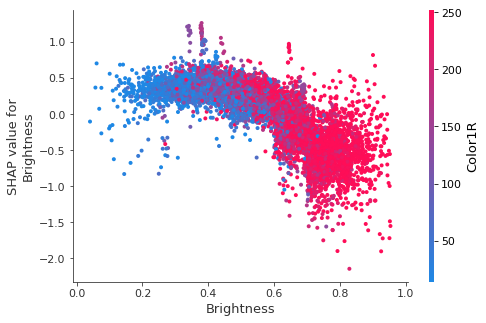

In [162]:
# create a SHAP dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot("Brightness", shap_values, sr_X_train)

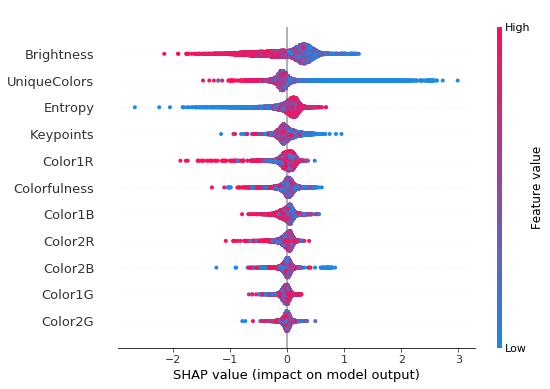

In [164]:
# summarize the effects of all the features
shap.summary_plot(shap_values, sr_X_train)

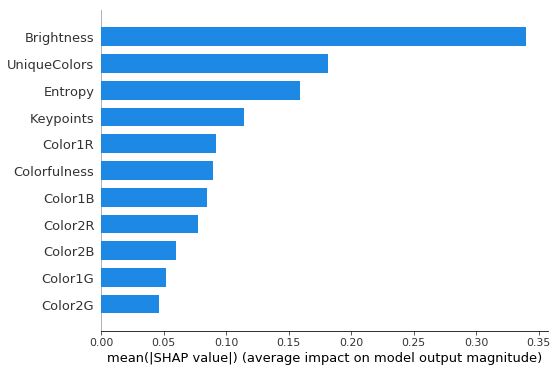

In [165]:
shap.summary_plot(shap_values, sr_X_train, plot_type="bar")

---

In [166]:
9024

9024

In [167]:
6752

6752

In [189]:
sr_data.index

Index(['0689871872', '0802774067', '1442496797', '0375824308', '0395899257',
       '1432993003', '0152001921', '0310730953', '1467702137', '1550749536',
       ...
       '0060234059', '1904194036', '1433958724', '0764144758', '142311664X',
       '0739338765', '0689813988', '1603204261', '1404803548', '1596470593'],
      dtype='object', name='ID', length=13356)

In [190]:
sr_data

,Brightness,Colorfulness,Entropy,UniqueColors,Keypoints,Color1R,Color1G,Color1B,Color2R,Color2G,Color2B,Sales Rank,Date,Review Score,Review Count,Title,Author
ID,,,,,,,,,,,,,,,,,
0689871872,0.393601,30.900888,7.208404,55245,0.025003,35,42,68,117,91,75,2642216.0,"January 6, 2005",0.00,0,Althea Gibson: Young Tennis Player (Childhood ...,Beatrice Gormley
0802774067,0.631390,90.699536,7.118225,123764,0.014360,188,236,193,208,240,166,2230093.0,"September 1, 1993",4.00,1,This Place Is High: The Andes Mountains of Sou...,Vicki Cobb
1442496797,0.525140,122.037335,6.843093,56732,0.018625,4,185,197,3,90,108,878409.0,"September 30, 2014",4.78,39,The Case of the Weird Blue Chicken: The Next M...,Doreen Cronin
0375824308,0.508363,62.399971,7.407145,95994,0.024494,180,163,120,41,135,101,14906.0,"September 14, 2004",4.41,117,Sergei Prokofiev's Peter and the Wolf: With a ...,Sergei Prokofiev
0395899257,0.841409,112.527855,3.904536,43675,0.007876,252,252,76,252,252,244,901312.0,"March 30, 1998",4.59,46,Curious George's ABCs,H. A. Rey
1432993003,0.387453,26.844075,7.760156,47033,0.032471,77,79,91,27,22,21,1615778.0,"January 1, 2014",5.00,1,The Assassination of John F. Kennedy: November...,Terry Collins
0152001921,0.589795,64.736021,7.395163,99807,0.031708,134,152,217,169,178,231,3844613.0,"October 1, 1997",4.88,26,Counting Crocodiles,Judy Sierra
0310730953,0.467417,60.502088,7.734455,77720,0.035227,74,89,154,180,161,136,194747.0,"September 30, 2014",4.80,20,Our Presidents Rock!,Juliette Turner
1467702137,0.434918,71.068264,7.615005,113505,0.024167,146,95,52,181,149,48,264657.0,"September 1, 2014",4.73,23,Dino-Boarding (Carolrhoda Picture Books) (Juni...,Lisa Wheeler


In [183]:
sr_data.loc['0980015693']

Brightness                                               0.692914
Colorfulness                                              56.0118
Entropy                                                    6.8604
UniqueColors                                                64144
Keypoints                                               0.0181031
Color1R                                                       243
Color1G                                                       236
Color1B                                                       183
Color2R                                                       125
Color2G                                                       109
Color2B                                                       160
Sales Rank                                            1.49172e+06
Date                                             February 1, 2011
Review Score                                                  4.2
Review Count                                                    5
Title     

In [180]:
sr_data.loc['1627791620']

Brightness                                               0.573737
Colorfulness                                              81.6777
Entropy                                                   6.76596
UniqueColors                                                52475
Keypoints                                               0.0268822
Color1R                                                       199
Color1G                                                       208
Color1B                                                       236
Color2R                                                        82
Color2G                                                        42
Color2B                                                       129
Sales Rank                                                 443505
Date                                              October 6, 2015
Review Score                                                 4.95
Review Count                                                   22
Title     

___

#### Tree Ensemble
We use the [CatBoost](https://github.com/catboost/catboost) library for creating the ensemble of trees.

In [120]:
model = CatBoostRegressor(random_seed=0, loss_function='MAPE', logging_level='Silent', iterations=100)

Plot the training:

In [121]:
model.fit(sr_X_train, sr_y_train, plot=True);

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [122]:
cv_params = model.get_params()

cv_data = cv(
    Pool(sr_X_train, sr_y_train),
    cv_params,
    plot=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [126]:
sr_test_preds = model.predict(sr_X_test)

In [127]:
print(sr_test_preds.round(2)[:10])
print(sr_y_test.values[:10])

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
[ 2230093.   901312.  1615778.   828260.   551879.  2297404.    77765.
   897686.   136359.  4896654.]


In [129]:
feature_importances = model.get_feature_importance(Pool(sr_X_train, sr_y_train))
feature_names = sr_X_train.columns
for score, name in sorted(zip(feature_importances, feature_names), reverse=True):
    print('{}: {}'.format(name, score))

Color1R: 15.829674855923004
Brightness: 13.14639129650798
UniqueColors: 11.158362583607442
Colorfulness: 10.645450487898916
Color2B: 9.673865592383429
Entropy: 9.327360415667028
Color1B: 7.903077368770907
Keypoints: 7.59843475053818
Color2R: 7.068983920031332
Color1G: 4.14025416471225
Color2G: 3.5081445639595406


### Sales Rank Classification

In [ ]:
y_train['Best Seller'] = y_train['Sales Rank'] < 10000
y_test['Best Seller'] = y_test['Sales Rank'] < 10000

In [ ]:
y_train.head()

In [ ]:
model = CatBoostClassifier(random_seed=0, custom_loss=['F1'], logging_level='Silent')

In [177]:
model.fit(X_train, y_train['Best Seller'], plot=True);

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [179]:
preds = model.predict(X_test)
trues = y_test['Best Seller']

In [180]:
print(preds.round()[:10])

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]


In [181]:
print(trues.values[:10])

[False False False False False  True False False False False]
